In [1]:
import time
from time import process_time
# starting process
start_time = time.process_time()

In [2]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [3]:
# Specify date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 10

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2012-10-24 01:49:20.735429 and End date: 2022-10-24 12:01:20.735429


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [4]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.tech_list + ds.energy_list + ds.industrials_list + ds.financials_list # ds.blend_list 

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'AAPL', 'IBM', 'TSLA', 'GOOGL', 'MSFT', 'CSCO', 'TSM', 'NVDA', 'DVN', 'OXY', 'NEE', 'MRO', 'APA', 'CTRA', 'BA', 'GE', 'CNI', 'NOC', 'LPX', 'BLDR', 'AAL', 'CPA', 'BHF', 'AIG', 'EQH', 'PFG', 'WBS']


### 2. Data Preparation

In [5]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [6]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(2516, 168)

Attributes    Adj Close                                                  \
Symbols     SP500_index        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2016-12-05  2204.709961   25.570005  117.132378   12.453333   38.910999   
2019-10-16  2989.689941   57.324867  117.112038   17.316668   62.150002   
2013-01-07  1461.890015   16.117682  126.444923    2.289333   18.387136   
2013-09-16  1697.599976   14.113326  128.216705   11.105333   22.216215   
2021-10-04  4300.459961  138.364670  131.078430  260.510010  133.659500   

Attributes                                                            ...  \
Symbols           MSFT       CSCO         TSM        NVDA        DVN  ...   
Date                                                                  ...   
2016-12-05   55.627792  24.505123   24.436945   22.655798  38.831402  ...   
2019-10-16  136.424606  42.609322   46.987728   48.361668  17.245560  ...   
2013-01-07   22.069855  14.963210   13.247017    2.949581  41.664005  ...   
2013-09-16   27.732553  18.252268   13.554957    3.711438  44.847713  ...   
2021-10-04  280.758606  52.579597  106.879173  197.161942  35.969162  ...   

Attributes     Volume                                                        \
Symbols           NOC        LPX       BLDR         AAL       CPA       BHF   
Date                                                                          
2016-12-05  1221000.0  1963000.0  1322800.0   5256400.0  420200.0       NaN   
2019-10-16   553600.0  2794300.0  2296000.0   6353300.0  302000.0  792400.0   
2013-01-07  1547000.0  1944400.0   410000.0   5730600.0  411200.0       NaN   
2013-09-16   957800.0  8518900.0   127300.0   5691300.0  142800.0       NaN   
2021-10-04   893800.0  1047800.0  1950800.0  28623400.0  297300.0  491600.0   

Attributes                                              
Symbols            AIG        EQH        PFG       WBS  
Date                                                    
2016-12-05   4706000.0        NaN  2987300.0  793700.0  
2019-10-16   3429200.0  1238400.0   810400.0  377500.0  
2013-01-07  18383700.0        NaN  1485900.0  479000.0  
2013-09-16   8848900.0        NaN  1321100.0  572000.0  
2021-10-04   5557000.0  1776600.0  1163800.0  734600.0  

[5 rows x 168 columns]

#### Cleaned Stock Data dataframe - close prices

In [7]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 29 columns from 174 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(2516, 29)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
832,2016-02-18,1917.829956,24.065001,126.625237,11.118000,35.875500,52.189999,26.430000,23.799999,7.510000,...,192.679993,15.200000,6.910000,39.540001,59.959999,NaN,51.919998,NaN,37.180000,33.130001
2140,2021-04-29,4211.470215,133.479996,137.896744,225.666672,119.638000,252.509995,51.459999,119.099998,153.247498,...,352.220001,68.260002,49.970001,21.299999,87.300003,47.099998,48.939999,34.779999,64.230003,54.320000
531,2014-12-05,2075.370117,28.750000,156.089859,14.914000,26.403999,48.419998,27.500000,22.740000,5.267500,...,147.690002,15.500000,6.650000,51.009998,109.410004,NaN,55.330002,NaN,53.470001,32.330002
2437,2022-07-05,3831.389893,141.559998,137.619995,233.066666,113.263000,262.850006,41.959999,76.110001,149.639999,...,464.359985,54.380001,58.689999,13.880000,65.070000,41.400002,51.130001,26.040001,66.570000,42.799999
444,2014-08-04,1938.989990,23.897499,181.300186,15.901333,29.113501,43.369999,25.170000,20.510000,4.412500,...,123.360001,13.820000,6.090000,38.139999,151.029999,NaN,52.660000,NaN,49.580002,28.559999


#### Confirm and review raw data storage in csv file

In [8]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(2516, 168)

Attributes    Adj Close                                                  \
Symbols           ^GSPC        AAPL         IBM        TSLA       GOOGL   
Date                                                                      
2019-08-01  2953.560059   50.787201  122.435219   15.590000   60.589001   
2018-10-15  2750.790039   52.351990  110.880051   17.306000   55.122002   
2022-07-01  3825.330078  138.737274  139.364105  227.263336  108.737503   
2018-03-20  2716.939941   41.898155  120.075333   20.703333   54.790001   
2016-12-08  2246.189941   26.275404  121.177505   12.819333   39.758499   

Attributes                                                           ...  \
Symbols           MSFT       CSCO        TSM        NVDA        DVN  ...   
Date                                                                 ...   
2019-08-01  133.696106  50.061745  38.964912   41.027332  20.936289  ...   
2018-10-15  102.928490  39.561035  34.925789   58.370369  29.772699  ...   
2022-07-01  259.030182  41.831440  76.566963  145.186859  53.870403  ...   
2018-03-20   88.362183  38.420731  38.980106   61.819672  25.914598  ...   
2016-12-08   56.357559  24.853659  25.295856   23.050327  38.831402  ...   

Attributes     Volume                                                         \
Symbols           NOC        LPX       BLDR         AAL       CPA        BHF   
Date                                                                           
2019-08-01   660500.0  1709600.0  1590000.0   8013000.0  221400.0  1165600.0   
2018-10-15   896700.0  2552200.0  1039400.0  11092500.0  434700.0  1447800.0   
2022-07-01   607000.0  1561600.0  3419500.0  34110400.0  548700.0  1066700.0   
2018-03-20   634100.0  1068200.0   475400.0   2555600.0  164600.0   581100.0   
2016-12-08  2847500.0  1315400.0  1517900.0   6240000.0  348100.0        NaN   

Attributes                                              
Symbols           AIG        EQH        PFG        WBS  
Date                                                    
2019-08-01  4706600.0  2697200.0  1960800.0  1598900.0  
2018-10-15  5061900.0   805100.0  2412600.0   423700.0  
2022-07-01  3363500.0  3142500.0  1575400.0  1333300.0  
2018-03-20  9030100.0        NaN  1004500.0   379100.0  
2016-12-08  5196500.0        NaN  1586400.0   991400.0  

[5 rows x 168 columns]

#### Clean, confirm, and review sample from csv raw data

In [9]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
Date,,,,,,,,,,,,,,,,,,,,,
2012-10-24,1408.750000,22.029642,182.332703,1.828000,16.949450,27.900000,17.379999,15.150000,3.042500,58.770000,...,69.330002,15.730000,5.070000,12.3700,88.690002,NaN,34.930000,NaN,27.969999,22.030001
2012-10-25,1412.969971,21.769285,183.173996,1.834667,16.960960,27.879999,17.200001,15.380000,3.045000,58.880001,...,69.040001,15.350000,5.110000,11.9700,88.540001,NaN,34.980000,NaN,28.290001,22.260000
2012-10-26,1411.939941,21.571428,184.770554,1.825333,16.895645,28.209999,17.290001,15.500000,3.012500,58.290001,...,68.019997,15.540000,5.160000,11.9200,88.730003,NaN,34.720001,NaN,27.700001,22.080000
2012-10-31,1412.160034,21.261429,185.975143,1.875333,17.024525,28.540001,17.150000,15.900000,2.995000,58.209999,...,68.690002,15.790000,5.510000,12.1800,92.820000,NaN,34.930000,NaN,27.540001,22.000000
2012-11-01,1427.589966,21.305000,188.479919,1.950000,17.206957,29.520000,17.510000,16.110001,3.137500,58.520000,...,68.919998,16.260000,5.850000,12.5500,93.910004,NaN,35.200001,NaN,28.290001,22.410000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-18,3719.979980,143.750000,122.940002,220.190002,100.769997,238.500000,41.790001,63.709999,119.669998,69.769997,...,506.799988,56.250000,60.650002,13.7000,74.209999,51.419998,52.599998,28.780001,79.879997,49.549999
2022-10-19,3695.159912,143.860001,122.510002,222.039993,99.629997,236.479996,41.880001,63.660000,120.510002,71.940002,...,510.910004,53.959999,56.340000,13.9900,73.900002,50.570000,52.750000,28.139999,78.769997,48.549999
2022-10-20,3665.780029,143.389999,128.300003,207.279999,99.970001,236.149994,41.709999,63.580002,121.940002,71.680000,...,512.440002,52.849998,54.450001,13.4600,73.919998,49.779999,51.849998,27.440001,77.559998,49.529999


### Create 'basket' from SQLite temp db

In [10]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(2516, 29)

,Date,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
819,2016-01-29,1940.239990,24.334999,119.302101,12.746667,38.067501,55.090000,23.790001,22.350000,7.322500,...,185.059998,15.720000,8.030000,38.990002,47.099998,NaN,56.480000,NaN,38.000000,33.169998
1613,2019-03-27,2805.370117,47.117500,133.116638,18.322001,58.900501,116.769997,53.139999,40.200001,44.125000,...,263.920013,24.209999,13.080000,30.940001,79.330002,35.279999,43.139999,19.879999,49.910000,50.240002
2328,2022-01-26,4349.930176,159.690002,134.259995,312.470001,129.233002,296.709991,55.330002,123.080002,227.720001,...,403.230011,64.470001,65.800003,16.240000,79.110001,53.750000,57.630001,33.090000,73.059998,60.009998
1729,2019-09-11,3000.929932,55.897499,137.284897,16.473333,61.000000,136.119995,50.029999,44.220001,46.082500,...,358.850006,24.850000,19.950001,29.760000,101.529999,39.299999,56.599998,21.670000,56.680000,48.369999
1552,2018-12-27,2488.830078,39.037498,108.776291,21.075333,52.645000,101.180000,42.910000,36.779999,32.792500,...,239.570007,21.879999,10.920000,32.040001,76.800003,31.590000,39.330002,15.650000,43.980000,47.930000


Indexed dataframe counts and column summary


(2516, 28)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
Date,,,,,,,,,,,,,,,,,,,,,
2021-05-04,4164.660156,127.849998,139.340347,224.533340,115.341499,247.789993,50.709999,115.360001,143.512497,23.450001,...,368.119995,72.099998,48.810001,21.420000,83.379997,47.380001,48.400002,34.549999,64.660004,54.680000
2012-12-31,1426.189941,19.006071,183.126190,2.258000,17.702202,26.709999,19.650000,17.160000,3.065000,52.040001,...,67.580002,19.320000,5.580000,13.500000,99.449997,NaN,35.299999,NaN,28.520000,20.549999
2019-05-08,2879.419922,50.724998,131.931168,16.322666,58.539001,125.510002,53.470001,43.700001,43.480000,31.530001,...,290.559998,24.530001,16.600000,33.750000,81.370003,40.200001,49.959999,22.010000,56.029999,51.669998
2015-11-25,2088.870117,29.507500,131.931168,15.309333,38.463001,53.689999,27.240000,22.559999,7.782500,45.910000,...,187.770004,18.250000,13.820000,41.310001,52.799999,NaN,63.150002,NaN,50.910000,40.029999
2016-01-29,1940.239990,24.334999,119.302101,12.746667,38.067501,55.090000,23.790001,22.350000,7.322500,27.900000,...,185.059998,15.720000,8.030000,38.990002,47.099998,NaN,56.480000,NaN,38.000000,33.169998


### 3. Quant Analysis

In [11]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.03
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.9217
Number of days of input dataframe to use as test/experiment data  =  0.07830000000000004


In [12]:
display(sql_basket_indexed_df.shape)

(2516, 28)

In [13]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  2516
Total # of days will use for hisotrical data =  2319
Total # of days will use for testing results =  197


In [14]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [15]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [16]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [17]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(924, 28)

,SP500_index,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
Date,,,,,,,,,,,,,,,,,,,,,
2020-05-26,0.012289,-0.006774,0.028465,0.002436,0.005753,-0.010572,-0.001336,0.020482,-0.034178,0.014003,...,-0.005278,0.042424,0.071950,0.148454,0.104868,0.094627,0.073382,0.088136,0.059572,0.130294
2019-05-02,-0.002124,-0.006508,-0.006901,0.043118,-0.005804,-0.013059,-0.011515,0.013236,0.015072,-0.028894,...,0.002143,-0.002018,0.025087,0.001180,0.014720,-0.002384,-0.001493,0.009375,-0.005977,0.014141
2020-08-18,0.002303,0.008333,0.003857,0.028028,0.026078,0.005754,-0.002613,-0.009727,-0.006181,-0.034072,...,-0.006357,0.008874,-0.017655,-0.001585,-0.017583,-0.030645,-0.012684,-0.019590,-0.014414,-0.046243
2021-10-06,0.004103,0.006307,-0.005519,0.002767,0.011336,0.015064,-0.013714,0.000732,0.012175,-0.034930,...,0.020115,-0.015701,0.007775,-0.043316,0.001484,-0.001478,-0.002263,0.004248,0.007952,-0.008706
2019-12-12,0.008575,0.002548,0.011663,0.019790,0.003154,0.010152,0.031391,0.048479,0.030965,0.024338,...,-0.008058,0.015061,-0.023920,0.032018,0.000192,0.046185,0.012299,0.024310,0.025037,0.053461


In [18]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [WBS]   (WBS_count)

In [19]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

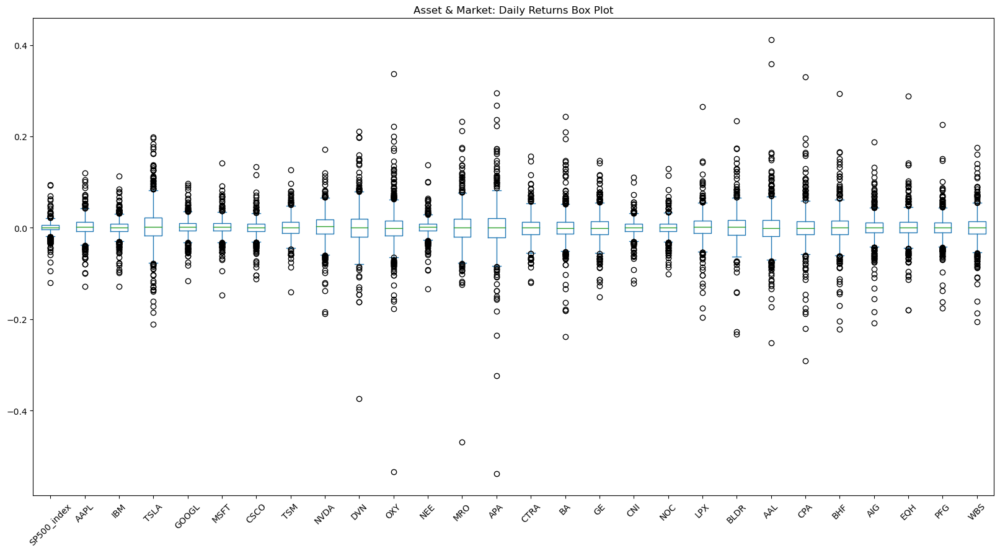

In [20]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [21]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.214503
CNI            0.259835
NEE            0.267476
NOC            0.283177
IBM            0.286270
GOOGL          0.292076
CSCO           0.292967
MSFT           0.298395
AAPL           0.333460
TSM            0.343796
CTRA           0.399486
PFG            0.412596
AIG            0.431883
EQH            0.442584
GE             0.464446
LPX            0.468573
WBS            0.483222
NVDA           0.490572
BA             0.531826
BLDR           0.541128
BHF            0.568267
CPA            0.586170
DVN            0.635972
MRO            0.636947
AAL            0.650580
TSLA           0.668793
OXY            0.679485
APA            0.769580
dtype: float64

In [22]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 1000,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


AAL           -0.022567
OXY           -0.014419
BA             0.010981
IBM            0.124209
CPA            0.133366
CTRA           0.149171
GE             0.156415
WBS            0.245525
MRO            0.260729
APA            0.291953
AIG            0.314872
NOC            0.342539
BHF            0.348975
PFG            0.374571
DVN            0.398233
CSCO           0.416001
EQH            0.556392
CNI            0.573799
SP500_index    0.793990
LPX            0.811989
NEE            0.892603
BLDR           0.986150
GOOGL          1.005313
NVDA           1.047733
TSM            1.080640
MSFT           1.215834
AAPL           1.220764
TSLA           1.497390
dtype: float64

:Bars   [index]   (0)

In [23]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
Date,,,,,,,,,,,,,,,,,,,,,
2012-10-24,22.029642,182.332703,1.828000,16.949450,27.900000,17.379999,15.150000,3.042500,58.770000,77.296394,...,69.330002,15.730000,5.070000,12.370000,88.690002,NaN,34.930000,NaN,27.969999,22.030001
2012-10-25,21.769285,183.173996,1.834667,16.960960,27.879999,17.200001,15.380000,3.045000,58.880001,79.059227,...,69.040001,15.350000,5.110000,11.970000,88.540001,NaN,34.980000,NaN,28.290001,22.260000
2012-10-26,21.571428,184.770554,1.825333,16.895645,28.209999,17.290001,15.500000,3.012500,58.290001,77.066460,...,68.019997,15.540000,5.160000,11.920000,88.730003,NaN,34.720001,NaN,27.700001,22.080000
2012-10-31,21.261429,185.975143,1.875333,17.024525,28.540001,17.150000,15.900000,2.995000,58.209999,75.648529,...,68.690002,15.790000,5.510000,12.180000,92.820000,NaN,34.930000,NaN,27.540001,22.000000
2012-11-01,21.305000,188.479919,1.950000,17.206957,29.520000,17.510000,16.110001,3.137500,58.520000,75.744339,...,68.919998,16.260000,5.850000,12.550000,93.910004,NaN,35.200001,NaN,28.290001,22.410000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-04,179.699997,138.020004,383.196655,144.399506,329.010010,61.250000,133.399994,292.899994,47.660000,33.380001,...,396.989990,76.900002,85.419998,19.020000,84.900002,56.700001,59.000000,34.450001,75.620003,59.509998
2022-01-05,174.919998,138.220001,362.706665,137.774994,316.380005,60.279999,127.059998,276.040009,46.610001,31.809999,...,394.989990,75.029999,82.400002,18.680000,81.800003,53.700001,58.189999,34.110001,74.220001,59.349998
2022-01-06,172.000000,135.339996,354.899994,137.747498,313.880005,60.919998,128.470001,281.779999,48.369999,32.759998,...,397.269989,75.099998,82.459999,18.570000,81.050003,55.259998,59.189999,35.119999,75.019997,61.860001


In [24]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
AAPL,0.111195,0.043808,0.093797,0.065526,0.076062,0.058183,0.064378,0.104623,0.072356,0.065979,...,0.031997,0.065522,0.072815,0.054701,0.052013,0.079653,0.052195,0.064183,0.058582,0.056755
IBM,0.043808,0.081951,0.042632,0.040256,0.043833,0.051577,0.040629,0.053791,0.083963,0.087267,...,0.040414,0.067613,0.068008,0.075927,0.061863,0.098110,0.069206,0.075628,0.070682,0.075824
TSLA,0.093797,0.042632,0.447284,0.070931,0.086130,0.049732,0.085048,0.137312,0.108605,0.095257,...,0.008711,0.104623,0.106588,0.088666,0.090669,0.096065,0.071189,0.076682,0.064996,0.073222
GOOGL,0.065526,0.040256,0.070931,0.085308,0.068811,0.048629,0.052758,0.089184,0.074997,0.068012,...,0.027725,0.059590,0.065674,0.051287,0.057492,0.074990,0.052652,0.058893,0.054528,0.054533
MSFT,0.076062,0.043833,0.086130,0.068811,0.089040,0.057898,0.057792,0.100688,0.066663,0.058987,...,0.033866,0.061492,0.068110,0.044987,0.053098,0.074081,0.050852,0.059935,0.053961,0.052645


Correlation Matrix:


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
AAPL,1.000000,0.458913,0.420583,0.672779,0.764426,0.595575,0.561553,0.639563,0.341186,0.291194,...,0.338848,0.419339,0.403530,0.252145,0.266101,0.420347,0.362424,0.434889,0.425791,0.352220
IBM,0.458913,1.000000,0.222674,0.481461,0.513137,0.614976,0.412820,0.383026,0.461184,0.448635,...,0.498540,0.504054,0.439019,0.407681,0.368665,0.603091,0.559759,0.596914,0.598419,0.548132
TSLA,0.420583,0.222674,1.000000,0.363120,0.431591,0.253819,0.369889,0.418519,0.255340,0.209617,...,0.045994,0.333854,0.294522,0.203781,0.231282,0.252769,0.246466,0.259064,0.235544,0.226571
GOOGL,0.672779,0.481461,0.363120,1.000000,0.789528,0.568302,0.525397,0.622425,0.403745,0.342695,...,0.335215,0.435412,0.415524,0.269904,0.335803,0.451806,0.417401,0.455586,0.452479,0.386383
MSFT,0.764426,0.513137,0.431591,0.789528,1.000000,0.662295,0.563348,0.687837,0.351281,0.290928,...,0.400793,0.439793,0.421810,0.231737,0.303573,0.436880,0.394595,0.453829,0.438289,0.365107
CSCO,0.595575,0.614976,0.253819,0.568302,0.662295,1.000000,0.455008,0.507321,0.406601,0.363025,...,0.439279,0.457623,0.376582,0.312214,0.289924,0.500660,0.461498,0.504417,0.527594,0.456340
TSM,0.561553,0.412820,0.369889,0.525397,0.563348,0.455008,1.000000,0.624894,0.357461,0.326173,...,0.223056,0.422837,0.395740,0.262098,0.279773,0.420701,0.341183,0.420411,0.396749,0.367303
NVDA,0.639563,0.383026,0.418519,0.622425,0.687837,0.507321,0.624894,1.000000,0.329972,0.246695,...,0.252009,0.397487,0.397075,0.210364,0.274710,0.373526,0.303099,0.370958,0.347464,0.280132
DVN,0.341186,0.461184,0.255340,0.403745,0.351281,0.406601,0.357461,0.329972,1.000000,0.797371,...,0.254469,0.487358,0.466550,0.429315,0.476690,0.603702,0.593802,0.604927,0.620236,0.615821
OXY,0.291194,0.448635,0.209617,0.342695,0.290928,0.363025,0.326173,0.246695,0.797371,1.000000,...,0.284710,0.424712,0.392552,0.426567,0.445253,0.591568,0.574964,0.595489,0.617182,0.601478


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

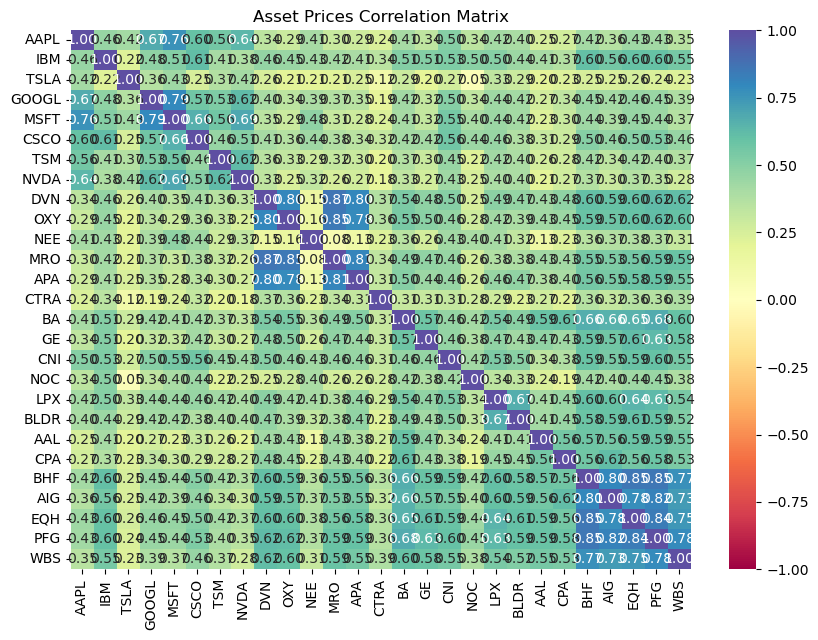

In [25]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot=True, 
    vmin=-1, 
    vmax=1, 
    fmt=".2f", 
    cmap="Spectral"
).set(
    title='Asset Prices Correlation Matrix')

In [26]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


AAPL     0.407075
IBM      0.035557
TSLA     1.001444
GOOGL    0.293628
MSFT     0.362799
CSCO     0.121875
TSM      0.371520
NVDA     0.513989
DVN      0.253265
OXY     -0.009797
NEE      0.238750
MRO      0.166071
APA      0.224681
CTRA     0.059592
BA       0.005840
GE       0.072646
CNI      0.149093
NOC      0.096999
LPX      0.380476
BLDR     0.533633
AAL     -0.014682
CPA      0.078175
BHF      0.198311
AIG      0.135988
EQH      0.246250
PFG      0.154546
WBS      0.118643
dtype: float64

___
### Efficient Frontier Computation

In [27]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 30)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,AAPL_W,IBM_W,TSLA_W,GOOGL_W,MSFT_W,CSCO_W,TSM_W,...,NOC_W,LPX_W,BLDR_W,AAL_W,CPA_W,BHF_W,AIG_W,EQH_W,PFG_W,WBS_W
1743,0.185082,5.081962,0.030516,0.018975,0.065976,0.008063,0.010365,0.076243,0.016353,0.036782,...,0.071746,0.026448,0.030161,0.045803,0.046801,0.065778,0.008992,0.055658,0.030538,0.027417
5598,0.219092,4.951638,0.038188,0.053254,0.017600,0.007303,0.069814,0.037636,0.063397,0.018963,...,0.004151,0.057603,0.069897,0.056038,0.043206,0.035607,0.069634,0.042079,0.014065,0.010501
9791,0.251463,5.150422,0.042999,0.018413,0.060019,0.056179,0.074043,0.047698,0.033808,0.040861,...,0.023754,0.070956,0.055120,0.062296,0.015961,0.025137,0.004155,0.048775,0.053835,0.026165
6545,0.240619,4.707915,0.044737,0.075828,0.067469,0.022233,0.028181,0.000546,0.038902,0.076583,...,0.034110,0.002355,0.070078,0.019843,0.031216,0.016731,0.042880,0.041488,0.020537,0.045735
6111,0.214931,5.386876,0.034330,0.003181,0.065270,0.006478,0.013153,0.050318,0.037707,0.003835,...,0.051703,0.065807,0.063791,0.002479,0.003926,0.013610,0.061182,0.065052,0.056526,0.050843


In [28]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.198136
Volatility     4.204121
SharpeRatio    0.039993
AAPL_W         0.032194
IBM_W          0.055885
TSLA_W         0.012497
GOOGL_W        0.028230
MSFT_W         0.060080
CSCO_W         0.061499
TSM_W          0.055562
NVDA_W         0.018286
DVN_W          0.003684
OXY_W          0.025096
NEE_W          0.076817
MRO_W          0.020175
APA_W          0.010161
CTRA_W         0.064275
BA_W           0.006015
GE_W           0.026385
CNI_W          0.074909
NOC_W          0.073591
LPX_W          0.034224
BLDR_W         0.011241
AAL_W          0.018961
CPA_W          0.027486
BHF_W          0.004147
AIG_W          0.043460
EQH_W          0.053896
PFG_W          0.034793
WBS_W          0.066451
Name: 5637, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.147291
Volatility     5.971729
SharpeRatio    0.019641
AAPL_W         0.008502
IBM_W          0.030525
TSLA_W         0.005325
GOOGL_W        0.017903
MSFT_W         0.009601
CSCO_W         0.027856
TSM_W          0.001047
NVDA_W         0.008899
DVN_W          0.069152
OXY_W          0.051164
NEE_W          0.009103
MRO_W          0.059868
APA_W          0.042165
CTRA_W         0.047716
BA_W           0.071760
GE_W           0.075294
CNI_W          0.024048
NOC_W          0.024347
LPX_W          0.054611
BLDR_W         0.007590
AAL_W          0.056738
CPA_W          0.080466
BHF_W          0.074917
AIG_W          0.046554
EQH_W          0.015000
PFG_W          0.066612
WBS_W          0.013237
Name: 6502, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.319356
Volatility     4.689184
SharpeRatio    0.061707
AAPL_W         0.077163
IBM_W          0.011063
TSLA_W         0.090914
GOOGL_W        0.080294
MSFT_W         0.088770
CSCO_W         0.024741
TSM_W          0.029005
NVDA_W         0.058942
DVN_W          0.071967
OXY_W          0.004279
NEE_W          0.045520
MRO_W          0.083426
APA_W          0.019585
CTRA_W         0.057705
BA_W           0.016082
GE_W           0.014984
CNI_W          0.050587
NOC_W          0.039275
LPX_W          0.018129
BLDR_W         0.018240
AAL_W          0.001955
CPA_W          0.001919
BHF_W          0.018184
AIG_W          0.000996
EQH_W          0.022245
PFG_W          0.027152
WBS_W          0.026879
Name: 7508, dtype: float64

In [29]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter(
    (
        efficient_frontier_df['Volatility'], 
        efficient_frontier_df['Returns'], 
        efficient_frontier_df.loc[:,'SharpeRatio']),
    'Volatility',
    ['Return', 'Sharpe Ratio'],
)
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', width=1000, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [30]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

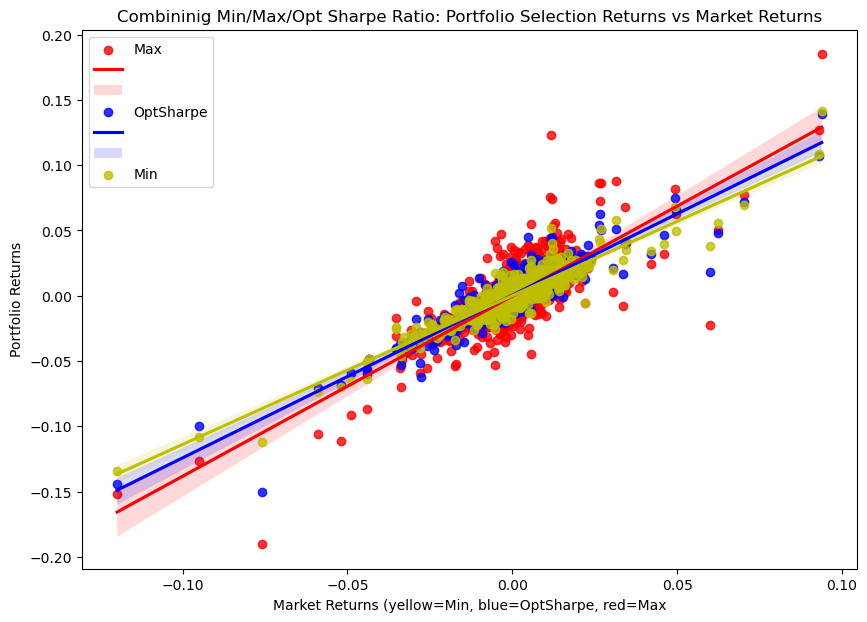

In [31]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

In [32]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_min_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Minimum / Lowest risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Balanced; Optimal Sharpe Ratio Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [34]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_max_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Max return, High risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [35]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
2022-01-12,175.529999,133.589996,368.73999,141.430496,318.269989,62.119999,132.229996,279.98999,49.900002,34.75,...,395.529999,76.730003,81.18,18.5,84.360001,56.75,61.369999,35.599998,76.519997,63.169998


,AAPL,IBM,TSLA,GOOGL,MSFT,CSCO,TSM,NVDA,DVN,OXY,...,NOC,LPX,BLDR,AAL,CPA,BHF,AIG,EQH,PFG,WBS
2022-10-24,148.410004,132.035004,207.013107,101.989998,245.679993,43.330002,61.18,124.794998,74.989998,71.039902,...,525.89502,56.59,57.66,13.9273,74.129997,52.82,53.924999,28.945,79.879997,51.689999


___
### Monte-Carlo Dataframe Weights List

In [36]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)

In [37]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]

print("Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:")
display(investment_pnl_min)
display(investment_pnl_opt_sharpe_ratio)
display(investment_pnl_max)

Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:


9312.934345245361

9184.323365211487

10248.418778419495

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [38]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 1200


In [39]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [40]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [41]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        BHF                     AIG                     EQH  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  49.840000     0.024882  51.730000     0.020114  28.170000   
2022-10-18  ...  51.419998     0.031701  52.599998     0.016818  28.780001   
2022-10-19  ...  50.570000    -0.016531  52.750000     0.002852  28.139999   
2022-10-20  ...  49.779999    -0.015622  51.849998    -0.017062  27.440001   
2022-10-21  ...  52.150002     0.047610  53.250000     0.027001  28.170000   

                               PFG                     WBS               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-17     0.014404  78.220001     0.021016  48.799999     0.022418  
2022-10-18     0.021654  79.879997     0.021222  49.549999     0.015369  
2022-10-19    -0.022238  78.769997    -0.013896  48.549999    -0.020182  
2022-10-20    -0.024876  77.559998    -0.015361  49.529999     0.020185  
2022-10-21     0.026603  78.839996     0.016503  50.869999     0.027054  

[5 rows x 54 columns]

In [42]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.990701,1.003361,1.000398,1.008138,1.006744,0.995379,1.002653,0.994269,0.993854,0.995426,...,0.995802,1.004627,1.008076,1.004994,0.997637,1.006704,0.994844,0.992290,1.001013,0.998636
2,0.990861,0.998703,1.001427,1.014103,0.998950,1.004282,1.005538,1.000200,0.994294,0.991710,...,0.999960,1.002895,0.998972,1.007236,0.995827,1.008205,0.991418,0.982642,1.001488,0.992480
3,0.989683,0.997972,0.994848,1.020659,1.002987,1.009525,0.993469,1.003364,0.989143,0.992786,...,0.991551,0.999541,0.993213,1.016931,0.994276,1.007516,0.993432,0.977538,0.997078,0.993957
4,0.984470,0.992522,1.009662,1.025808,0.995865,1.011425,0.996982,1.002785,0.991758,0.990877,...,0.987049,0.999565,0.993128,1.016158,0.991969,1.005971,0.987110,0.972726,0.991143,0.992581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,0.869861,0.951215,0.842297,0.925957,0.989527,0.862306,1.098188,1.069171,0.927445,0.963458,...,1.067463,0.809598,0.913584,0.906242,1.002269,0.966339,0.859430,0.946332,0.917601,1.057517
194,0.870444,0.949424,0.842895,0.910149,0.986984,0.860442,1.092760,1.058266,0.925170,0.961562,...,1.063821,0.808892,0.913598,0.915276,1.006256,0.959761,0.862075,0.950188,0.913652,1.062996
195,0.861280,0.952263,0.841849,0.909506,0.992422,0.850865,1.096594,1.061312,0.921681,0.964019,...,1.065672,0.809967,0.910222,0.911016,0.999451,0.958954,0.867419,0.959101,0.915051,1.061804
196,0.864318,0.951512,0.845068,0.915408,0.992653,0.854778,1.100185,1.050617,0.921673,0.963368,...,1.064567,0.813215,0.910035,0.903975,1.001793,0.958131,0.868918,0.957477,0.918773,1.058604


In [43]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        BHF                     AIG                     EQH  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  49.840000     0.024882  51.730000     0.020114  28.170000   
2022-10-18  ...  51.419998     0.031701  52.599998     0.016818  28.780001   
2022-10-19  ...  50.570000    -0.016531  52.750000     0.002852  28.139999   
2022-10-20  ...  49.779999    -0.015622  51.849998    -0.017062  27.440001   
2022-10-21  ...  52.150002     0.047610  53.250000     0.027001  28.170000   

                               PFG                     WBS               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-17     0.014404  78.220001     0.021016  48.799999     0.022418  
2022-10-18     0.021654  79.879997     0.021222  49.549999     0.015369  
2022-10-19    -0.022238  78.769997    -0.013896  48.549999    -0.020182  
2022-10-20    -0.024876  77.559998    -0.015361  49.529999     0.020185  
2022-10-21     0.026603  78.839996     0.016503  50.869999     0.027054  

[5 rows x 54 columns]

In [44]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.995265,0.989933,1.009573,0.999877,1.000535,0.993332,0.993285,0.990251,0.997371,0.998265,...,1.001446,1.005059,0.994329,0.999450,0.996850,0.997568,0.991137,1.012918,1.007276,0.994394
2,1.000809,0.994053,1.003388,1.003386,0.993530,0.992029,0.988267,0.996098,1.003712,1.007396,...,1.000408,1.007325,0.983930,0.998512,1.003074,1.004361,0.991060,1.018956,0.998195,1.011606
3,0.995346,1.001101,1.018594,1.013286,0.994537,0.994684,0.988992,1.001078,0.995663,1.014932,...,0.996850,0.992574,0.977706,0.992576,1.010451,1.010405,0.986929,1.023472,0.996995,1.017213
4,1.000045,1.016429,1.027193,1.010933,0.990738,0.996651,0.984327,1.007515,1.001116,1.003755,...,1.004271,0.990197,0.985745,0.992253,1.015908,1.016160,0.991185,1.018736,0.989310,1.011486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,0.959584,1.028936,1.087398,0.953258,1.079089,1.166954,1.062584,0.982613,1.081235,0.996540,...,1.179752,0.965412,1.113858,0.859155,1.186758,0.990883,1.020841,1.059136,0.933664,0.935831
194,0.958934,1.032857,1.091545,0.958157,1.083716,1.158871,1.060804,0.977695,1.076383,0.992941,...,1.172382,0.976003,1.117231,0.862402,1.177316,0.986236,1.028958,1.050268,0.933637,0.936717
195,0.952727,1.037354,1.082024,0.958653,1.075697,1.164069,1.068944,0.977093,1.078362,0.983203,...,1.165867,0.977962,1.117336,0.857049,1.166273,0.974264,1.028299,1.065020,0.934718,0.940245
196,0.956195,1.024174,1.073117,0.956125,1.070381,1.155621,1.057712,0.963446,1.068802,0.986011,...,1.173002,0.973362,1.110388,0.861596,1.168072,0.976370,1.012804,1.061844,0.922374,0.940980


In [45]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


AAPL                      IBM                     TSLA  \
                 close daily_return       close daily_return       close   
Date                                                                       
2022-10-17  142.410004     0.029123  121.519997     0.012329  219.350006   
2022-10-18  143.750000     0.009409  122.940002     0.011685  220.190002   
2022-10-19  143.860001     0.000765  122.510002    -0.003498  222.039993   
2022-10-20  143.389999    -0.003267  128.300003     0.047261  207.279999   
2022-10-21  147.270004     0.027059  129.899994     0.012471  214.440002   

                              GOOGL                     MSFT               \
           daily_return       close daily_return       close daily_return   
Date                                                                        
2022-10-17     0.070052   99.970001     0.035315  237.529999     0.039246   
2022-10-18     0.003829  100.769997     0.008002  238.500000     0.004084   
2022-10-19     0.008402   99.629997    -0.011313  236.479996    -0.008470   
2022-10-20    -0.066474   99.970001     0.003413  236.149994    -0.001395   
2022-10-21     0.034543  101.129997     0.011603  242.119995     0.025281   

            ...        BHF                     AIG                     EQH  \
            ...      close daily_return      close daily_return      close   
Date        ...                                                              
2022-10-17  ...  49.840000     0.024882  51.730000     0.020114  28.170000   
2022-10-18  ...  51.419998     0.031701  52.599998     0.016818  28.780001   
2022-10-19  ...  50.570000    -0.016531  52.750000     0.002852  28.139999   
2022-10-20  ...  49.779999    -0.015622  51.849998    -0.017062  27.440001   
2022-10-21  ...  52.150002     0.047610  53.250000     0.027001  28.170000   

                               PFG                     WBS               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-17     0.014404  78.220001     0.021016  48.799999     0.022418  
2022-10-18     0.021654  79.879997     0.021222  49.549999     0.015369  
2022-10-19    -0.022238  78.769997    -0.013896  48.549999    -0.020182  
2022-10-20    -0.024876  77.559998    -0.015361  49.529999     0.020185  
2022-10-21     0.026603  78.839996     0.016503  50.869999     0.027054  

[5 rows x 54 columns]

In [46]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.004125,0.994240,1.005504,1.001284,0.992262,1.001410,1.006117,1.014143,1.009995,0.991921,...,0.991280,1.002495,1.004518,1.003546,0.996934,1.005375,0.992423,0.994458,0.997811,0.993045
2,1.009883,0.998187,1.003657,0.996470,0.995758,0.999723,1.013632,1.030550,1.006344,0.987114,...,0.993874,1.005055,1.010917,1.007340,1.002470,1.006668,0.990747,0.990784,0.981608,0.986961
3,1.013909,0.996246,0.981682,0.977384,0.991107,0.998577,1.023008,1.030013,0.994417,0.993645,...,0.984033,1.004928,1.023206,1.004660,0.984696,0.997525,0.988352,0.997745,0.986659,0.975832
4,1.010412,0.989692,0.975041,0.978434,1.006734,0.991330,1.015372,1.032952,1.004411,0.998872,...,0.974859,1.012779,1.026623,0.994291,0.992679,1.007712,1.001843,0.996157,0.994861,0.970777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,0.784517,1.108056,0.884551,0.674427,0.843941,1.040889,0.997845,0.926000,0.936724,0.927543,...,0.764035,0.876321,0.847187,1.072088,0.946516,0.968956,1.180735,1.008737,0.929986,0.883628
194,0.781696,1.098636,0.884950,0.677656,0.842497,1.027548,1.005289,0.925184,0.939791,0.932120,...,0.770931,0.873156,0.855999,1.069830,0.945164,0.972631,1.186263,1.010850,0.930639,0.868307
195,0.783616,1.094152,0.881869,0.688071,0.845168,1.018574,0.999165,0.934236,0.934353,0.939516,...,0.782782,0.878851,0.854061,1.080816,0.948249,0.976614,1.177178,1.021995,0.923143,0.880513
196,0.788863,1.108572,0.876542,0.687876,0.832646,1.008833,1.007528,0.927972,0.940466,0.935680,...,0.783376,0.874791,0.861051,1.078423,0.950080,0.968744,1.175455,1.025353,0.922895,0.886686


### 4. Visualizations

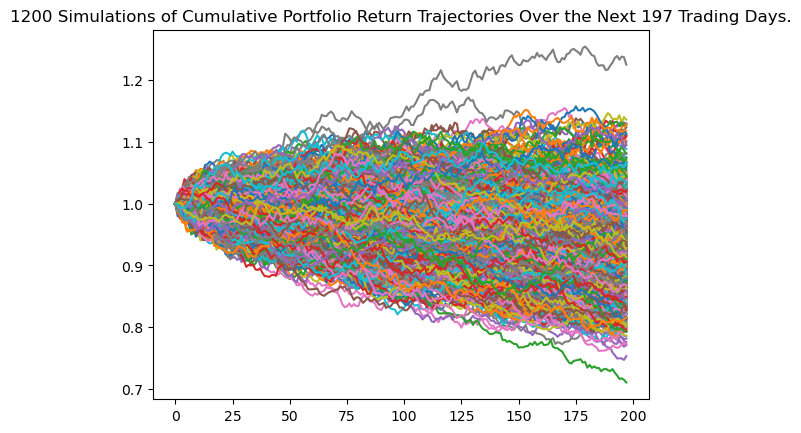

In [47]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

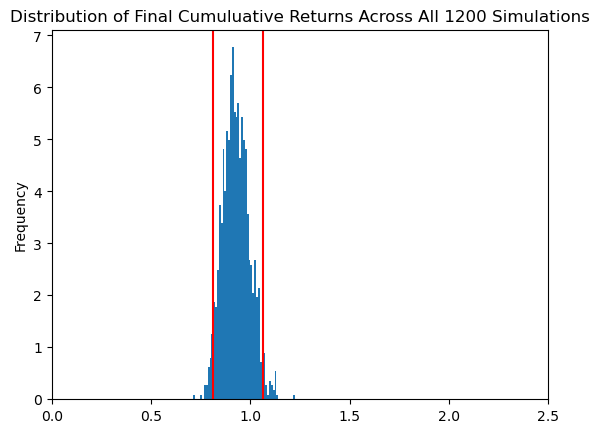

In [48]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

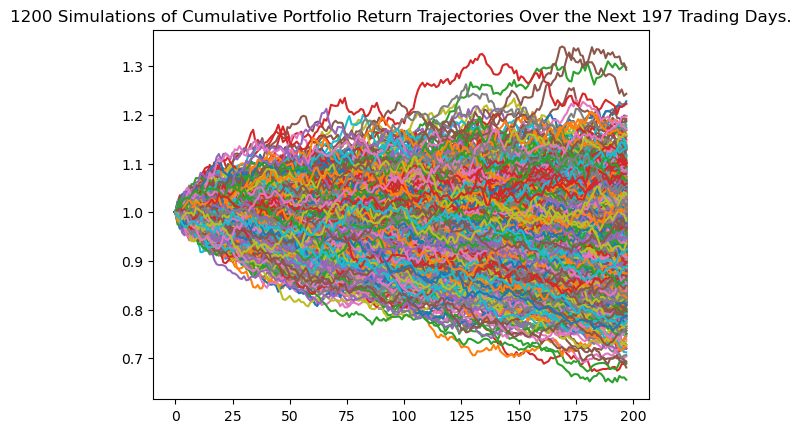

In [49]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

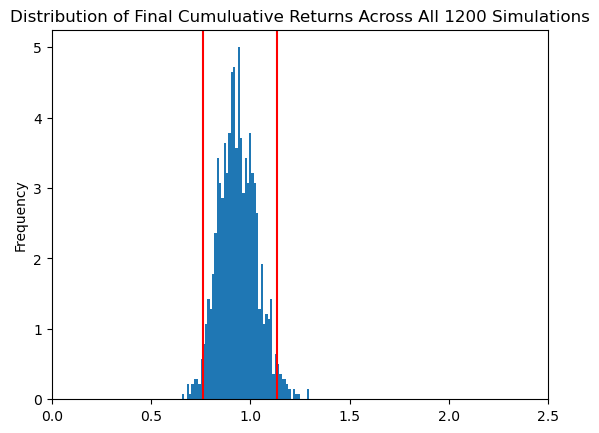

In [50]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

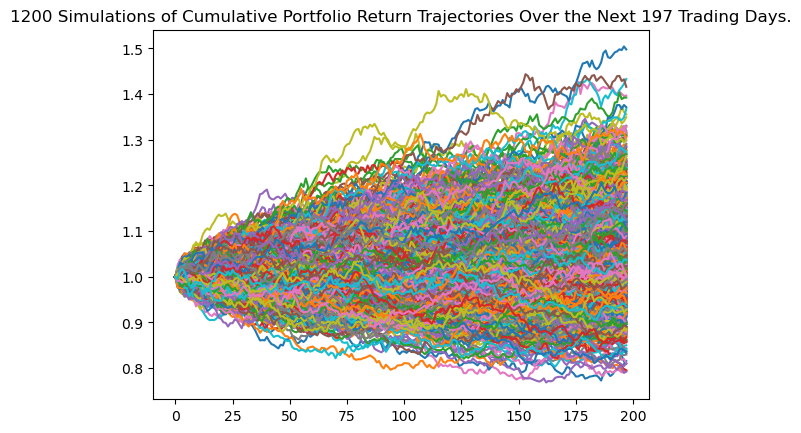

In [51]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

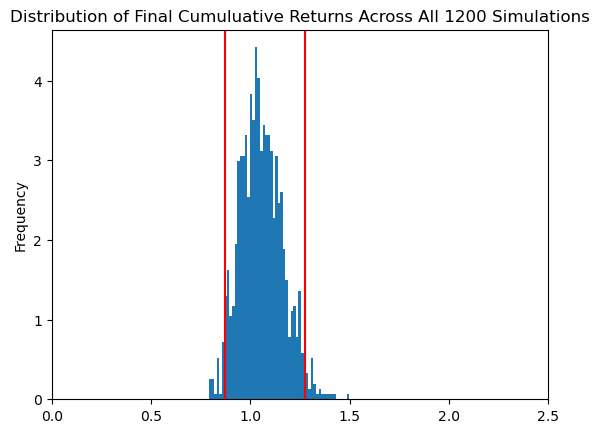

In [52]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           1200.000000
mean               0.928400
std                0.067147
min                0.710489
25%                0.880664
50%                0.923840
75%                0.972022
max                1.224818
95% CI Lower       0.809313
95% CI Upper       1.065966
Name: 197, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           1200.000000
mean               0.937675
std                0.095726
min                0.655671
25%                0.870844
50%                0.932261
75%                1.003226
max                1.297351
95% CI Lower       0.761327
95% CI Upper       1.134523
Name: 197, dtype: float64


In [55]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           1200.000000
mean               1.054987
std                0.106953
min                0.792285
25%                0.978525
50%                1.047386
75%                1.127044
max                1.497645
95% CI Lower       0.872390
95% CI Upper       1.276853
Name: 197, dtype: float64


In [56]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8093.13 and $10659.66.
The actual realized value of the portfolio was $9312.93


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $7613.27 and $11345.23.
The actual realized value of the portfolio was $9184.32


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $8723.90 and $12768.53.
The actual realized value of the portfolio was $10248.42


In [60]:
# ending process
end_time = time.process_time()
print("Process time", end_time - start_time)

Process time 84.589736
